# Comparing Simulated vs Normal Sentinel-2 Patches

This notebook compares natural color (RGB) visualizations of simulated and original Sentinel-2 patches from the Sen1Floods11 dataset.

## 1. Import Required Libraries

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import rasterio
from skimage import exposure
import warnings
warnings.filterwarnings('ignore')

# Configuration
%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['image.cmap'] = 'viridis'

## 2. Load Simulated and Normal Patches

In [25]:
# Define paths to data directories
# Update these paths based on your data location
ORIGINAL_S2_DIR = Path("datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand")
SIMULATED_DIR = Path("tiff_folder/simulated_sen1floods/simulated_train")

# Helper function to load patches
def load_patch(file_path):
    """Load TIFF file as numpy array."""
    with rasterio.open(file_path) as src:
        data = src.read()  # Returns (bands, height, width)
    return data

def normalize_image(image, percentile_range=(2, 98)):
    """Normalize image to 0-1 range using percentile clipping."""
    # Clip to percentile range for better contrast
    vmin, vmax = np.percentile(image, percentile_range)
    normalized = np.clip((image - vmin) / (vmax - vmin + 1e-8), 0, 1)
    return normalized

def get_rgb_bands(image, band_indices=(2, 1, 0)):
    """Extract RGB bands and return as (height, width, 3) array.
    
    Default band indices assume standard S2 band order where:
    - Band 0: Coastal aerosol (60m)
    - Band 1: Blue (10m)
    - Band 2: Green (10m)
    - Band 3: Red (10m)
    ...
    
    For 10m resolution bands, typical RGB mapping is:
    - Red: Band 3 (index 3)
    - Green: Band 2 (index 2)
    - Blue: Band 1 (index 1)
    """
    # Adjust indices based on your data structure
    # This assumes bands are in order and you want RGB
    rgb = np.stack([image[band_indices[0]], image[band_indices[1]], image[band_indices[2]]], axis=-1)
    
    # Normalize each channel independently for better contrast
    rgb_normalized = np.stack([
        normalize_image(rgb[:, :, i]) for i in range(3)
    ], axis=-1)
    
    return rgb_normalized

# Find sample patches - START WITH SIMULATED
print(f"Looking for simulated patches in: {SIMULATED_DIR}")
print(f"Looking for original patches in: {ORIGINAL_S2_DIR}")

if SIMULATED_DIR.exists():
    simulated_files = sorted(list(SIMULATED_DIR.glob("**/*.tif")))[:5]
    print(f"\nFound {len(simulated_files)} simulated patches")
    for f in simulated_files:
        print(f"  - {f.name}")
else:
    print(f"Warning: Simulated data directory not found: {SIMULATED_DIR}")
    simulated_files = []

if ORIGINAL_S2_DIR.exists():
    # Find original counterpart files based on simulated file names
    original_files = []
    for sim_file in simulated_files:
        # Try to extract original name from simulated filename
        # Common pattern: simulated_<original_name>.tif
        orig_name = sim_file.name.replace("simulated_", "")
        orig_file = ORIGINAL_S2_DIR / orig_name
        print(f"Checking for original file: {orig_file}")
        if orig_file.exists():
            original_files.append(orig_file)
        else:
            print(f"Warning: Original file not found for {sim_file.name}")
    print(f"\nFound {len(original_files)} matching original patches")
    for f in original_files:
        print(f"  - {f.name}")
else:
    print(f"Warning: Original S2 directory not found: {ORIGINAL_S2_DIR}")
    original_files = []

Looking for simulated patches in: tiff_folder/simulated_sen1floods/simulated_train
Looking for original patches in: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand

Found 5 simulated patches
  - simulated_Ghana_103272_S2Hand.tif
  - simulated_Ghana_1089161_S2Hand.tif
  - simulated_Ghana_11745_S2Hand.tif
  - simulated_Ghana_128663_S2Hand.tif
  - simulated_Ghana_134751_S2Hand.tif
Checking for original file: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand/Ghana_103272_S2Hand.tif
Checking for original file: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand/Ghana_1089161_S2Hand.tif
Checking for original file: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand/Ghana_11745_S2Hand.tif
Checking for original file: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand/Ghana_128663_S2Hand.tif
Checking for original file: datasets/sen1floods11/v1.1/data/flood_events/HandLabeled/S2Hand/Ghana_134751_S2Hand.tif

Found 5 matching origi

## 3. Display Patches Side-by-Side

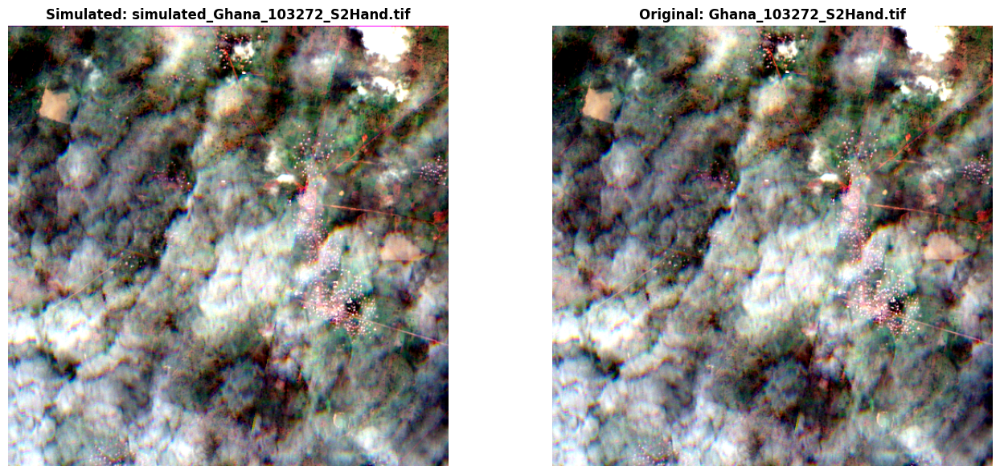

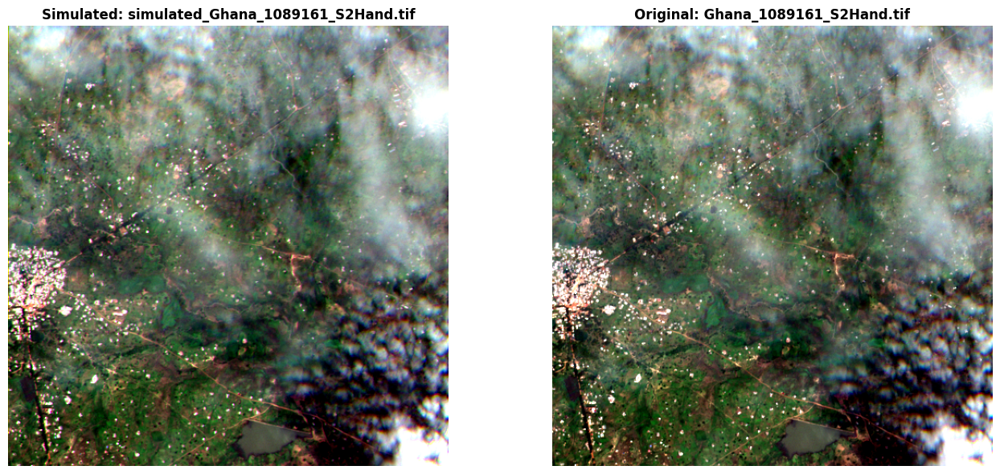

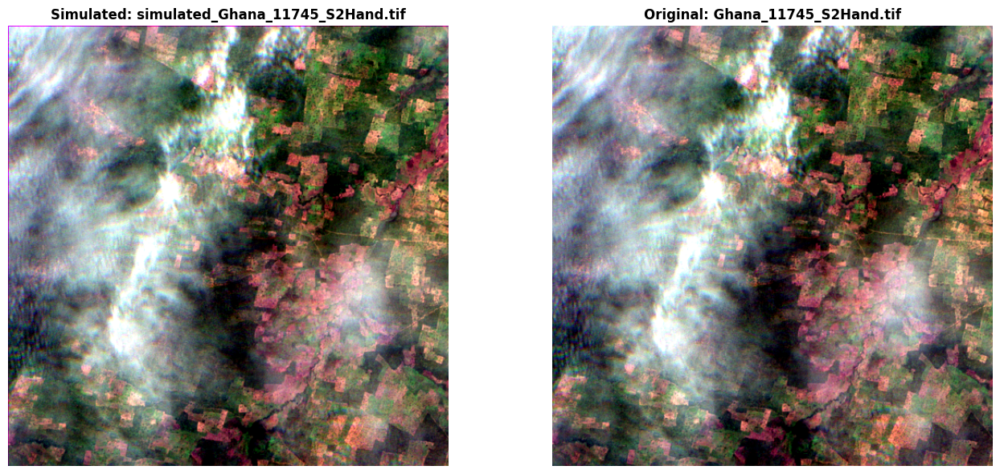

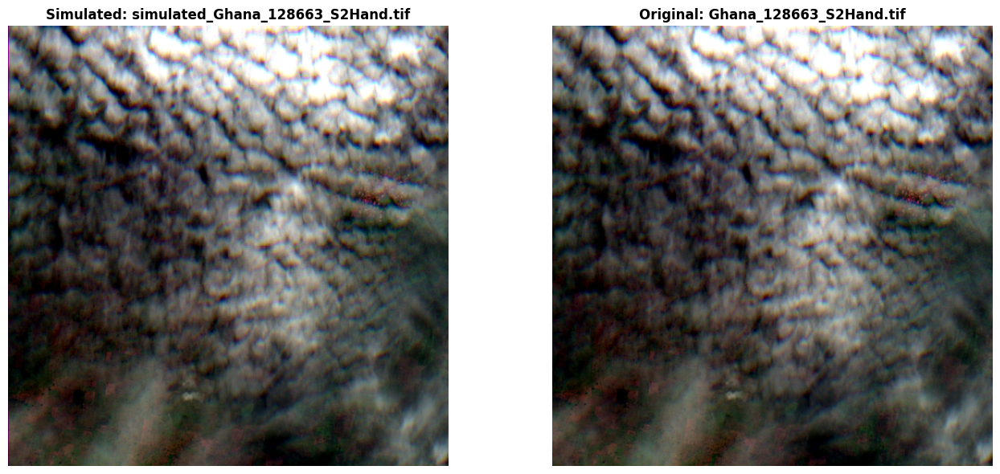

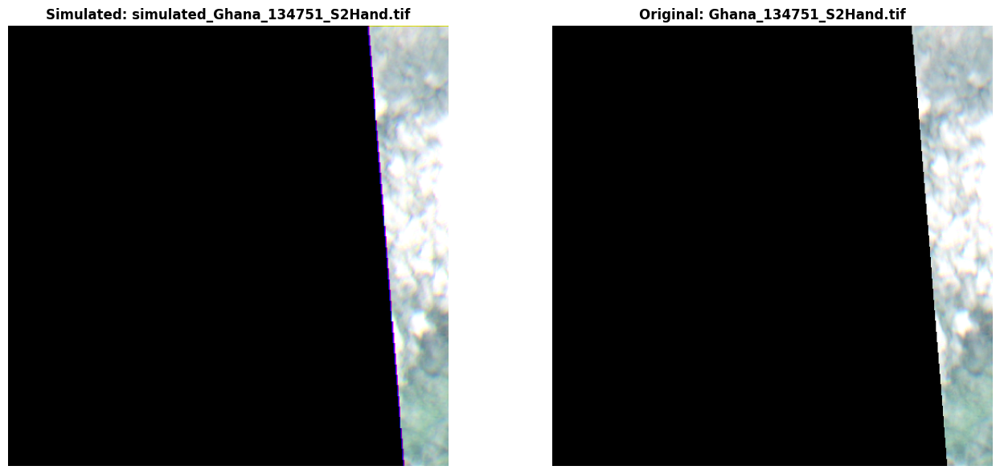

In [ ]:
# Display patches side-by-side
for idx, simulated_file in enumerate(simulated_files[:5]):
    # Find matching original file
    orig_name = simulated_file.name.replace("simulated_", "")
    original_file = ORIGINAL_S2_DIR / orig_name
    
    if not original_file.exists():
        print(f"Warning: Could not find {orig_name}")
        continue
    
    try:
        # Load data
        sim_data = load_patch(simulated_file)
        orig_data = load_patch(original_file)
        
        # Extract RGB using helper function
        sim_rgb = get_rgb_bands(sim_data)
        orig_rgb = get_rgb_bands(orig_data, band_indices=(3, 2, 1))
        
        # Display
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        axes[0].imshow(sim_rgb)
        axes[0].set_title(f"Simulated: {simulated_file.name}", fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(orig_rgb)
        axes[1].set_title(f"Original: {original_file.name}", fontsize=12, fontweight='bold')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error processing sample {idx + 1}: {e}")

## 4. Calculate and Visualize Differences

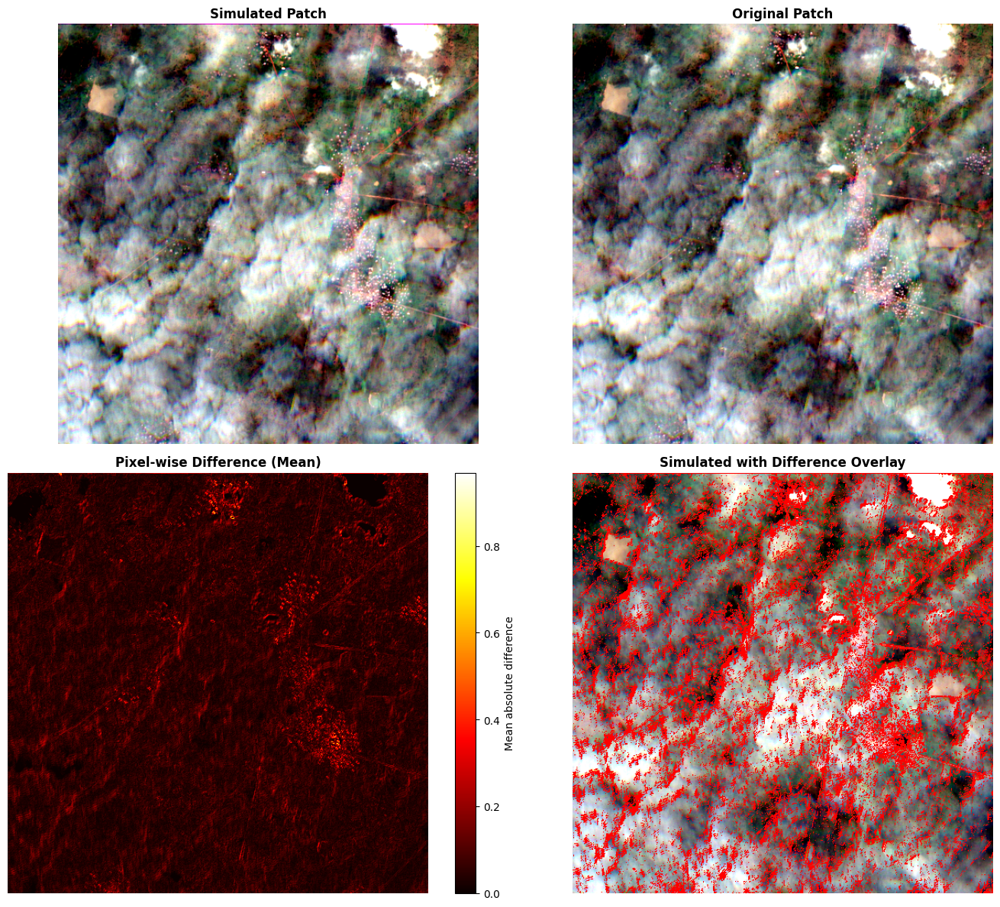


Sample 1:
  Mean: 0.0562, Std: 0.0570, Max: 1.0000


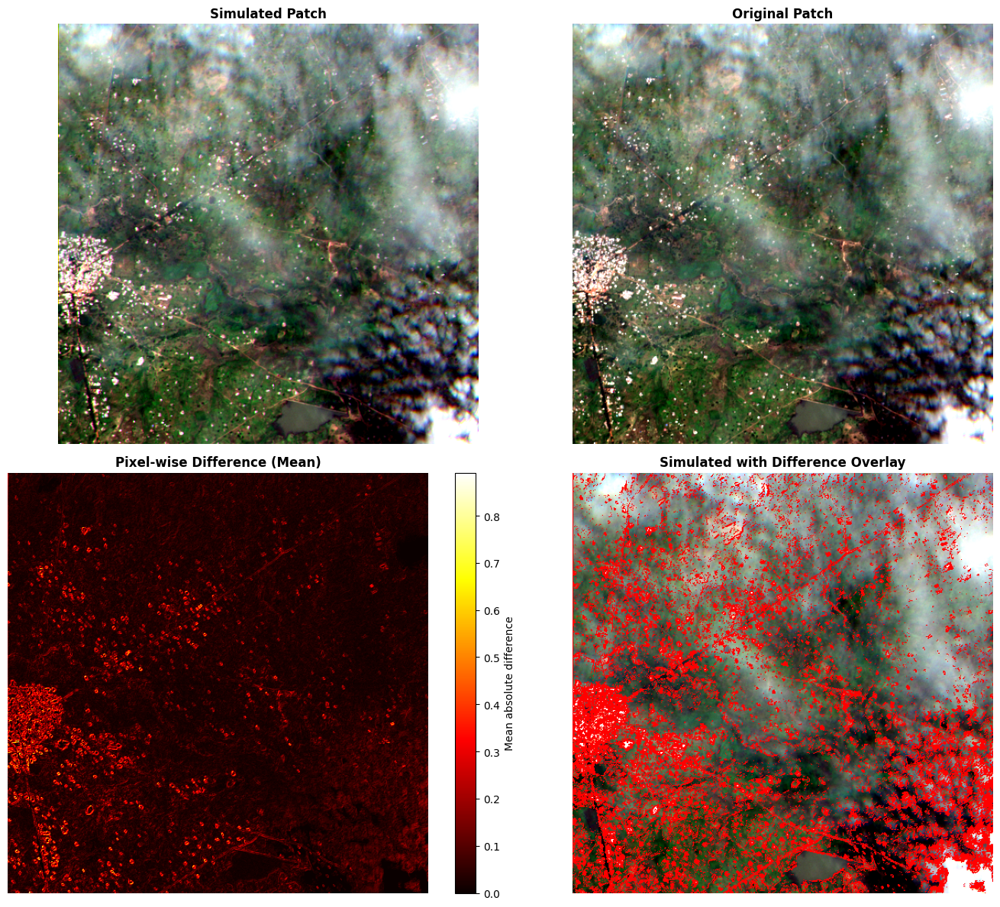


Sample 2:
  Mean: 0.0474, Std: 0.0684, Max: 1.0000


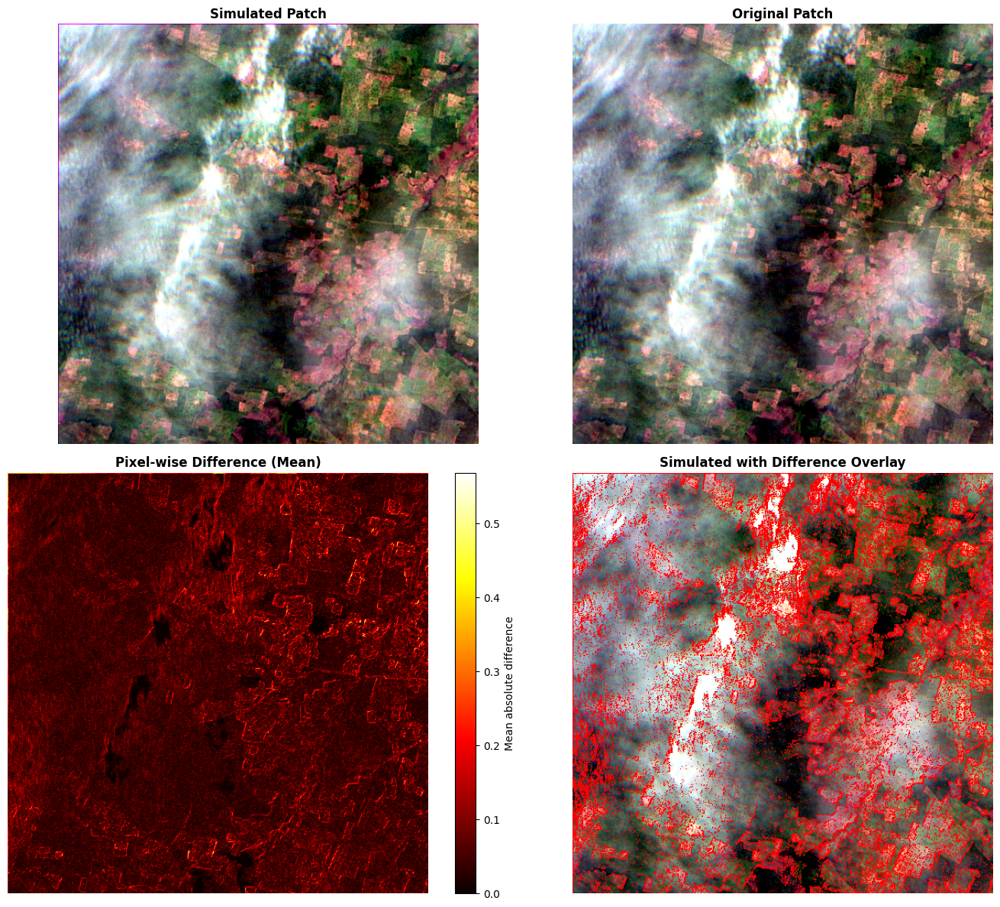


Sample 3:
  Mean: 0.0538, Std: 0.0549, Max: 1.0000


In [28]:
# Compute and visualize pixel-wise differences
for idx, simulated_file in enumerate(simulated_files[:num_samples]):
    orig_name = simulated_file.name.replace("simulated_", "")
    original_file = ORIGINAL_S2_DIR / orig_name
    
    if not original_file.exists():
        continue
    
    try:
        # Load data
        sim_data = load_patch(simulated_file)
        orig_data = load_patch(original_file)
        
        # Extract RGB using helper function
        sim_rgb = get_rgb_bands(sim_data)
        orig_rgb = get_rgb_bands(orig_data, band_indices=(3, 2, 1))
        
        # Calculate differences
        diff = np.abs(sim_rgb - orig_rgb)
        diff_mean = np.mean(diff, axis=2)
        
        # Visualize
        fig, axes = plt.subplots(2, 2, figsize=(14, 12))
        
        axes[0, 0].imshow(sim_rgb)
        axes[0, 0].set_title('Simulated Patch', fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(orig_rgb)
        axes[0, 1].set_title('Original Patch', fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        im1 = axes[1, 0].imshow(diff_mean, cmap='hot')
        axes[1, 0].set_title('Pixel-wise Difference (Mean)', fontsize=12, fontweight='bold')
        axes[1, 0].axis('off')
        plt.colorbar(im1, ax=axes[1, 0], label='Mean absolute difference')
        
        overlay = sim_rgb.copy()
        overlay[diff_mean > np.percentile(diff_mean, 75)] = [1, 0, 0]
        axes[1, 1].imshow(overlay)
        axes[1, 1].set_title('Simulated with Difference Overlay', fontsize=12, fontweight='bold')
        axes[1, 1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"\nSample {idx + 1}:")
        print(f"  Mean: {np.mean(diff):.4f}, Std: {np.std(diff):.4f}, Max: {np.max(diff):.4f}")
        
    except Exception as e:
        print(f"Error processing sample {idx + 1}: {e}")

## 5. Statistical Comparison of Patches


Sample 1:
  Red: Sim=0.492±0.239 | Orig=0.484±0.240
  Green: Sim=0.487±0.240 | Orig=0.466±0.244
  Blue: Sim=0.466±0.244 | Orig=0.457±0.246

Sample 2:
  Red: Sim=0.387±0.223 | Orig=0.421±0.215
  Green: Sim=0.423±0.216 | Orig=0.361±0.229
  Blue: Sim=0.365±0.229 | Orig=0.349±0.232

Sample 3:
  Red: Sim=0.457±0.250 | Orig=0.438±0.238
  Green: Sim=0.445±0.236 | Orig=0.410±0.248
  Blue: Sim=0.408±0.248 | Orig=0.399±0.258


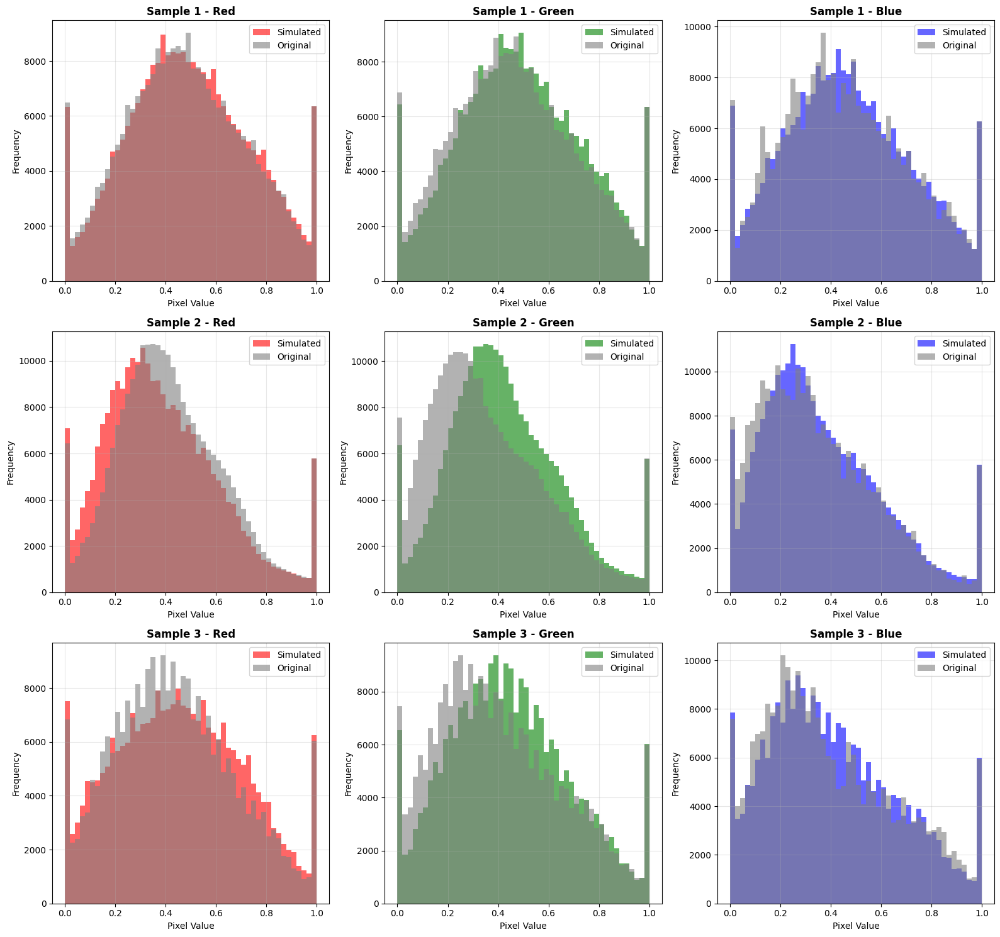

In [21]:
# Statistical comparison: histograms and distributions
fig, axes = plt.subplots(num_samples, 3, figsize=(16, 5 * num_samples))
if num_samples == 1:
    axes = axes.reshape(1, -1)

for idx, simulated_file in enumerate(simulated_files[:num_samples]):
    orig_name = simulated_file.name.replace("simulated_", "")
    original_file = ORIGINAL_S2_DIR / orig_name
    
    if not original_file.exists():
        continue
    
    try:
        # Load and normalize
        with rasterio.open(simulated_file) as src:
            sim_data = src.read()
        with rasterio.open(original_file) as src:
            orig_data = src.read()
        
        def norm_channel(ch):
            vmin, vmax = np.percentile(ch, (2, 98))
            return np.clip((ch - vmin) / (vmax - vmin + 1e-8), 0, 1)
        
        sim_rgb = np.stack([norm_channel(sim_data[i]) for i in [2, 1, 0]], axis=-1)
        orig_rgb = np.stack([norm_channel(orig_data[i]) for i in [2, 1, 0]], axis=-1)
        
        # Plot histograms
        colors = ['red', 'green', 'blue']
        names = ['Red', 'Green', 'Blue']
        
        for ch in range(3):
            axes[idx, ch].hist(sim_rgb[:, :, ch].flatten(), bins=50, alpha=0.6, label='Simulated', color=colors[ch])
            axes[idx, ch].hist(orig_rgb[:, :, ch].flatten(), bins=50, alpha=0.6, label='Original', color='gray')
            axes[idx, ch].set_title(f'Sample {idx + 1} - {names[ch]}', fontweight='bold')
            axes[idx, ch].set_xlabel('Pixel Value')
            axes[idx, ch].set_ylabel('Frequency')
            axes[idx, ch].legend()
            axes[idx, ch].grid(alpha=0.3)
        
        print(f"\nSample {idx + 1}:")
        for ch, name in enumerate(names):
            sim_mean, sim_std = np.mean(sim_rgb[:, :, ch]), np.std(sim_rgb[:, :, ch])
            orig_mean, orig_std = np.mean(orig_rgb[:, :, ch]), np.std(orig_rgb[:, :, ch])
            print(f"  {name}: Sim={sim_mean:.3f}±{sim_std:.3f} | Orig={orig_mean:.3f}±{orig_std:.3f}")
        
    except Exception as e:
        print(f"Error processing sample {idx + 1}: {e}")

plt.tight_layout()
plt.show()

## Notes and Customization

**Adjust band indices for different visualizations:**
- Natural color (RGB): `[2, 1, 0]` (current)
- False color (NIR-Red-Green): `[7, 3, 2]` 
- SWIR-Red-Green: `[11, 3, 2]`

Change the line `for i in [2, 1, 0]` in any cell to use different bands.

**Parameters to modify:**
- `percentile_range=(2, 98)` - Adjust contrast by changing percentile values
- `num_samples` - Change how many patches to display
- `cmap='hot'` - Change colormap for difference visualization